# Hierarchical Soccer Model
+ Introduction
+ Data Prep
+ Model 1.1 - Hierarchical - direct lift from original paper
+ About League Football
+ Forward Model
+ Model 1.2 - Non Hierarchical Model
+ Why Hierarchical?
+ Model 1.3 - Hierarchical with modified prior distributions
+ Hierarchical Model Troubleshooting
+ Model 1.4 - Non-centred Hierarchical Model
+ Comparison of model 1.4 Results to Original Paper
+ Shrinkage
+ Summary
+ Resources

In [1]:
import os
import sys
import itertools
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotnine as p9
from plotnine import *

import pymc as pm
import arviz as az
import pytensor.tensor as pt
import arviz as az
# from scipy.stats import poisson

%load_ext dotenv
%dotenv
PROJECT_DIR=Path(os.environ.get('PROJECT_DIR'))
sys.path.append(str(PROJECT_DIR))
from notebooks.scripts.helpers import make_1x2_calib_data, format_season_df

In [2]:
# %matplotlib inline
%load_ext autoreload
%autoreload 2

theme_set(theme_bw())
pd.set_option('display.max_columns', 100)
SEED = 1925
LOCAL_DATA_DIR = PROJECT_DIR / 'data'
LOCAL_DATA_DIR

PosixPath('/media/david/T7/code/model-bettor/soccer-preds-001/hierarchical-soccer-model/data')

In [3]:
%load_ext watermark
%watermark --iversions

pandas    : 2.0.3
pymc      : 5.7.1
matplotlib: 3.7.2
pytensor  : 2.14.2
sys       : 3.9.16 | packaged by conda-forge | (main, Feb  1 2023, 21:39:03) 
[GCC 11.3.0]
arviz     : 0.16.1
plotnine  : 0.12.2
numpy     : 1.24.4



# Data Prep
### Italy Serie A 1992-1993

In [4]:
df_orig1 = pd.read_parquet(LOCAL_DATA_DIR / 'italy_serie-a_1991-1992.parquet')
df_orig1

,Wk,Day,Date,Home,Away,Referee,h_ftgoals,a_ftgoals
0,1,Sun,1991-09-01,Napoli,Atalanta,Piero Ceccarini,1.0,0.0
1,1,Sun,1991-09-01,Juventus,Fiorentina,Angelo Amendolia,1.0,0.0
2,1,Sun,1991-09-01,Lazio,Parma,Carlo Sguizzato,1.0,1.0
3,1,Sun,1991-09-01,Cagliari,Sampdoria,Gianni Beschin,3.0,2.0
4,1,Sun,1991-09-01,Bari,Torino,Loris Stafoggia,1.0,1.0
...,...,...,...,...,...,...,...,...
301,34,Sun,1992-05-24,Roma,Bari,Angelo Amendolia,2.0,0.0
302,34,Sun,1992-05-24,Parma,Fiorentina,Massimo Chiesa,1.0,1.0
303,34,Sun,1992-05-24,Cagliari,Lazio,Graziano Cesari,0.0,1.0
304,34,Sun,1992-05-24,Sampdoria,Cremonese,Roberto Bettin,2.0,2.0


### Modify column names to match original paper

In [5]:
df = df_orig1.copy()
df, team_dict = format_season_df(df_orig1)
df

,g,home,away,hg,ag,yg1,yg2,result
0,0,Verona,Roma,17,14,0.0,1.0,awin
1,1,Napoli,Atalanta,12,1,1.0,0.0,hwin
2,2,Lazio,Parma,10,13,1.0,1.0,draw
3,3,Juventus,Fiorentina,9,5,1.0,0.0,hwin
4,4,Inter,Foggia,8,6,1.0,1.0,draw
...,...,...,...,...,...,...,...,...
301,301,Parma,Fiorentina,13,5,1.0,1.0,draw
302,302,Napoli,Genoa,12,7,1.0,0.0,hwin
303,303,Inter,Atalanta,8,1,0.0,0.0,draw
304,304,Foggia,Milan,6,11,2.0,8.0,awin


In [6]:
# team_dict

# Model 1.1 - Hierarchical - direct lift from original paper
+ First model as described in the paper - [Bayesian hierarchical model for the prediction of football results - section 2 - Gianluca Baio1 & Marta A. Blangiardo 2010](https://discovery.ucl.ac.uk/id/eprint/16040/1/16040.pdf)
+ Code directly translated from original winbugs code to pymc
+ Variables renamed to correspond to naming in original paper

In [7]:
n_teams = df['hg'].nunique()
home_idx = df['hg'].values
away_idx = df['ag'].values
home_goals = df['yg1'].values
away_goals = df['yg2'].values
print(f'n_teams: {n_teams}')
print(f'home team indices (home_idx): {home_idx[0:5]}...')
print(f'away team indices (away_idx): {away_idx[0:5]}...')
print(f'home goals : {home_goals[0:5]}...')
print(f'away goals: {away_goals[0:5]}...')
tau = 0.0001
sigma = np.sqrt(1.0/tau)
print(f'sigma: {sigma}')

n_teams: 18
home team indices (home_idx): [17 12 10  9  8]...
away team indices (away_idx): [14  1 13  5  6]...
home goals : [0. 1. 1. 1. 1.]...
away goals: [1. 0. 1. 0. 1.]...
sigma: 100.0


In [8]:
with pm.Model() as model1_1:
    # hyper-priors
    mu_att = pm.Normal('mu_att', mu=0, sigma=sigma)
    tau_att = pm.Gamma('tau_att', 0.01, 0.01)    
    mu_def = pm.Normal('mu_def', mu=0, sigma=sigma)
    tau_def = pm.Gamma('tau_def', 0.01, 0.01)

    # priors
    home = pm.Normal("home", mu=0, sigma=sigma)
    att_t = pm.Normal('att_t', mu=mu_att, tau=tau_att, shape=n_teams)
    def_t = pm.Normal('def_t', mu=mu_def, tau=tau_def, shape=n_teams)

    # Apply zero sum constraint
    att_t_adj = pm.Deterministic("att_t_adj", att_t - pt.mean(att_t))
    def_t_adj = pm.Deterministic('def_t_adj', def_t - pt.mean(def_t))

    # log linear random effect model
    theta_home = pm.Deterministic('theta_home', pt.exp(home + att_t_adj[home_idx] + def_t_adj[away_idx]))
    theta_away = pm.Deterministic('theta_away', pt.exp(att_t_adj[away_idx] + def_t_adj[home_idx]))
    
    # likelihood
    home_lambda = pm.Poisson('home_lambda', mu=theta_home, observed=home_goals)
    away_lambda = pm.Poisson('away_lambda', mu=theta_away, observed=away_goals)

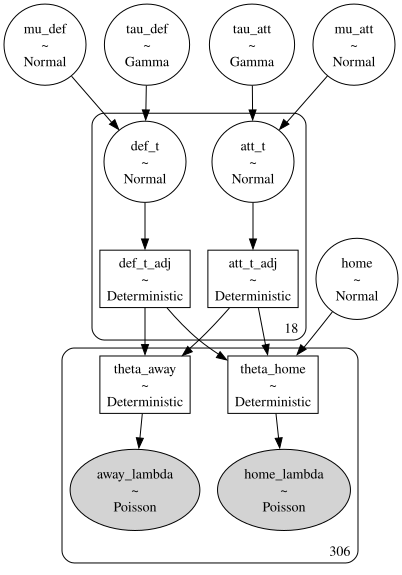

In [9]:
pm.model_to_graphviz(model1_1)

In [10]:
# # Crashes pymc - ValueError: lam value too large
# with model1_1:
#     idata1_1 = pm.sample_prior_predictive()

In [11]:
with model1_1:
    idata1_1 = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_att, tau_att, mu_def, tau_def, home, att_t, def_t]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 139 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
There were 944 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


In [12]:
# idata1_1

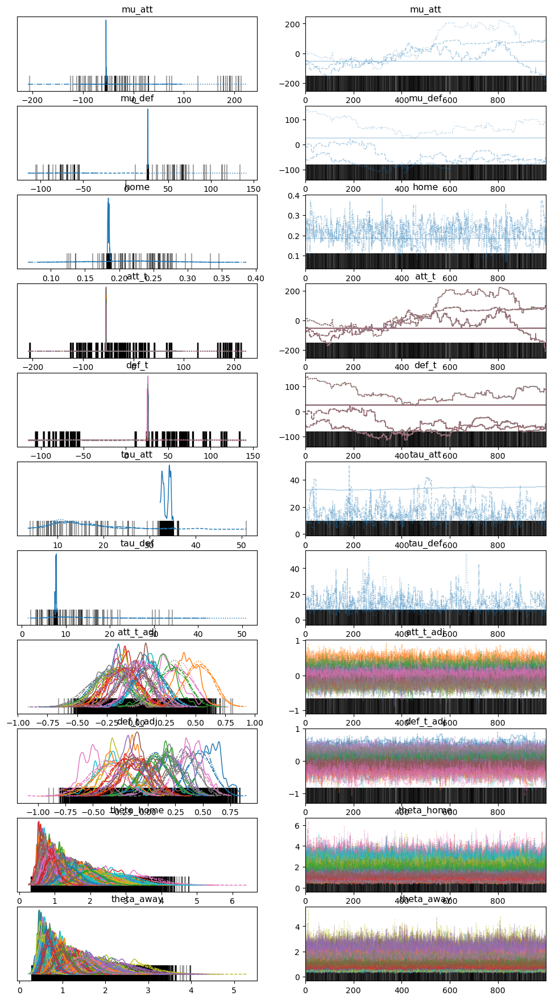

In [13]:
az.plot_trace(idata1_1);

# About League Football
+ Serie-a 1992-1993 season had 18 teams.
+ In a season - every team plays every other team in the league, once at home and once away.
+ The fixtures are sequenced so that a team alternates between home and away games.
+ This means the 1992-1993 season comprised 18 x 17 = 306 matches.
+ Every game can result in one of 3 outcomes - a home win, a draw or an away win.
+ At the end of every season 3 teams are relegated from the league, and 3 new teams are promoted into the league.
+ Football is a low scoring game, with a reasonably high degree of randomness. The distribution of goals can be modeled by a poisson distribution - See [Predicting Football Results With Statistical Modelling](https://dashee87.github.io/football/python/predicting-football-results-with-statistical-modelling/)

# Forward Model
### Key Inputs
+ If we ignore the hierachical structure we have 3 key inputs
    + home advantage `home` (common across all teams)
    + attack ability `att_t` - The attacking strength of each team
    + defence ability `def_t` - The defending capability of each team
### Zero sum constraint   
+ The attack and defence abilities are adjusted/constrained to sum to zero. This is done by subtracting the mean attack ability (calculated across all teams) from the attack ability of each team. Same for defence.
### Link function and mean score calculation 
+ Every match in the fixture list has a two "expected goals" numbers - one for the home team and one for the away team. 
+ These are calculated using the adjusted attack and defence abilities which are fed into 2 equations for every match in the fixture list:
    + theta_home_team = exponential(home advantage + adj_attack[home team] + adj_defence[away_team])
    + theta_away_team = exponential(adj_attack[away_team] + adj_defence[home_team]
### Goal scoring data
+ We now have an "expected goals" number for the home team and the away team for every fixture. This number is modeled as the mean of a poisson distribution, so for each match in the fixture list, we can sample from the relevant poisson distributions to get a score.
### Approach
+ Build a forward model - try various inputs for home advantage, attack ability and defence ability - and get a feel for how well the model output matches the scores we expect to see in a top football league.

In [14]:
def simulate_season(home, fixtures):    
    fixtures['home_team_raw'] = home + fixtures['home_team_att'] + fixtures['away_team_def']
    fixtures['away_team_raw'] = fixtures['away_team_att'] + fixtures['home_team_def']
    fixtures['theta_home_team'] = np.exp(fixtures['home_team_raw'])
    fixtures['theta_away_team'] = np.exp(fixtures['away_team_raw'])

    fixtures['home_team_goals'] = np.random.poisson(lam=fixtures['theta_home_team'])
    fixtures['away_team_goals'] = np.random.poisson(lam=fixtures['theta_away_team'])

    return fixtures   

def apply_zero_sum_constraint(att_t, def_t):
    att_t_adj = att_t - np.mean(att_t)
    def_t_adj = def_t - np.mean(def_t)
    
    return att_t_adj, def_t_adj
    
teams = [0, 1, 2]
fixtures = np.array(list(zip(*list(itertools.permutations(teams, 2))))).T
df_fixtures = pd.DataFrame(fixtures, columns=['home_team', 'away_team'])
df_fixtures

,home_team,away_team
0,0,1
1,0,2
2,1,0
3,1,2
4,2,0
5,2,1


In [15]:
att_t = [1, 2, 3]
def_t = [1, 2, 3]

att_t_adj, def_t_adj = apply_zero_sum_constraint(att_t, def_t)
att_t_adj, def_t_adj

(array([-1.,  0.,  1.]), array([-1.,  0.,  1.]))

In [16]:
df_fixtures['home_team_att'] = df_fixtures['home_team'].map(lambda x: att_t_adj[x])
df_fixtures

,home_team,away_team,home_team_att
0,0,1,-1.0
1,0,2,-1.0
2,1,0,0.0
3,1,2,0.0
4,2,0,1.0
5,2,1,1.0


In [17]:
df_fixtures['home_team_def'] = df_fixtures['home_team'].map(lambda x: def_t_adj[x])
df_fixtures['away_team_att'] = df_fixtures['away_team'].map(lambda x: att_t_adj[x])
df_fixtures['away_team_def'] = df_fixtures['away_team'].map(lambda x: def_t_adj[x])
df_fixtures

,home_team,away_team,home_team_att,home_team_def,away_team_att,away_team_def
0,0,1,-1.0,-1.0,0.0,0.0
1,0,2,-1.0,-1.0,1.0,1.0
2,1,0,0.0,0.0,-1.0,-1.0
3,1,2,0.0,0.0,1.0,1.0
4,2,0,1.0,1.0,-1.0,-1.0
5,2,1,1.0,1.0,0.0,0.0


In [18]:
home = 1
results = simulate_season(home, df_fixtures)
results

,home_team,away_team,home_team_att,home_team_def,away_team_att,away_team_def,home_team_raw,away_team_raw,theta_home_team,theta_away_team,home_team_goals,away_team_goals
0,0,1,-1.0,-1.0,0.0,0.0,0.0,-1.0,1.000000,0.367879,0,0
1,0,2,-1.0,-1.0,1.0,1.0,1.0,0.0,2.718282,1.000000,3,0
2,1,0,0.0,0.0,-1.0,-1.0,0.0,-1.0,1.000000,0.367879,2,1
3,1,2,0.0,0.0,1.0,1.0,2.0,1.0,7.389056,2.718282,8,5
4,2,0,1.0,1.0,-1.0,-1.0,1.0,0.0,2.718282,1.000000,2,1
5,2,1,1.0,1.0,0.0,0.0,2.0,1.0,7.389056,2.718282,6,4


In [19]:
def forward_model(home, att_t, def_t, n_teams):
    teams = np.arange(n_teams)
    fixtures = np.array(list(zip(*list(itertools.permutations(teams, 2))))).T
    df_fixtures = pd.DataFrame(fixtures, columns=['home_team', 'away_team'])

    att_t_adj, def_t_adj = apply_zero_sum_constraint(att_t, def_t)

    df_fixtures['home_team_att'] = df_fixtures['home_team'].map(lambda x: att_t_adj[x])
    df_fixtures['home_team_def'] = df_fixtures['home_team'].map(lambda x: def_t_adj[x])
    df_fixtures['away_team_att'] = df_fixtures['away_team'].map(lambda x: att_t_adj[x])
    df_fixtures['away_team_def'] = df_fixtures['away_team'].map(lambda x: def_t_adj[x])

    return simulate_season(home, df_fixtures)

In [20]:
n_teams = 18
att_t = np.random.uniform(0, 20, size=n_teams)
def_t = np.random.uniform(0, 20, size=n_teams)
home = 10
season_sim = forward_model(home, att_t, def_t, n_teams)
season_sim

,home_team,away_team,home_team_att,home_team_def,away_team_att,away_team_def,home_team_raw,away_team_raw,theta_home_team,theta_away_team,home_team_goals,away_team_goals
0,0,1,2.084857,-2.754058,2.677813,6.572385,18.657242,-0.076245,1.266886e+08,9.265889e-01,126702167,2
1,0,2,2.084857,-2.754058,-1.524767,-0.809062,11.275796,-4.278825,7.888888e+04,1.385893e-02,78690,0
2,0,3,2.084857,-2.754058,3.094600,0.445324,12.530182,0.340541,2.765596e+05,1.405708e+00,276506,4
3,0,4,2.084857,-2.754058,1.404235,-3.356731,8.728126,-1.349823,6.174147e+03,2.592862e-01,6244,0
4,0,5,2.084857,-2.754058,-7.533908,-1.268556,10.816302,-10.287966,4.982647e+04,3.404027e-05,49808,0
...,...,...,...,...,...,...,...,...,...,...,...,...
301,17,12,5.145655,-4.628538,4.144967,4.382328,19.527983,-0.483572,3.026183e+08,6.165773e-01,302629320,0
302,17,13,5.145655,-4.628538,-9.331613,-3.911352,11.234303,-13.960152,7.568253e+04,8.653327e-07,76194,0
303,17,14,5.145655,-4.628538,-3.128261,6.517743,21.663398,-7.756799,2.560319e+09,4.278238e-04,2560336026,0
304,17,15,5.145655,-4.628538,8.933464,5.185705,20.331360,4.304926,6.757677e+08,7.406373e+01,675797624,73


In [21]:
n_teams = 18
att_t = np.random.uniform(0, 3, size=n_teams)
def_t = np.random.uniform(-3, 0, size=n_teams)
home = 0.5
season_sim = forward_model(home, att_t, def_t, n_teams).reset_index().rename(columns={'index': 'game_num'})
season_sim

,game_num,home_team,away_team,home_team_att,home_team_def,away_team_att,away_team_def,home_team_raw,away_team_raw,theta_home_team,theta_away_team,home_team_goals,away_team_goals
0,0,0,1,-0.449084,0.761922,-0.532961,-1.518159,-1.467242,0.228961,0.230560,1.257293,1,2
1,1,0,2,-0.449084,0.761922,-0.920784,0.247877,0.298793,-0.158862,1.348231,0.853114,1,0
2,2,0,3,-0.449084,0.761922,0.520087,0.118298,0.169214,1.282009,1.184374,3.603871,0,5
3,3,0,4,-0.449084,0.761922,-0.767506,0.867120,0.918036,-0.005584,2.504367,0.994432,3,1
4,4,0,5,-0.449084,0.761922,1.275905,-0.365494,-0.314577,2.037827,0.730097,7.673919,0,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,301,17,12,1.675648,-0.400784,0.011183,-0.203009,1.972639,-0.389601,7.189628,0.677327,10,0
302,302,17,13,1.675648,-0.400784,0.194047,0.215255,2.390903,-0.206738,10.923355,0.813233,15,1
303,303,17,14,1.675648,-0.400784,0.682040,1.199511,3.375160,0.281256,29.228947,1.324793,22,0
304,304,17,15,1.675648,-0.400784,0.415950,0.753901,2.929550,0.015166,18.719202,1.015281,14,2


In [22]:
# season_sim['theta_home_team'].min()

0.11287417886940328

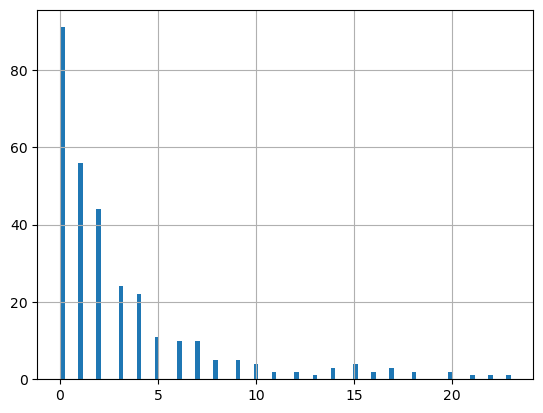

In [23]:
# season_sim['home_team_goals'].hist(bins=100);

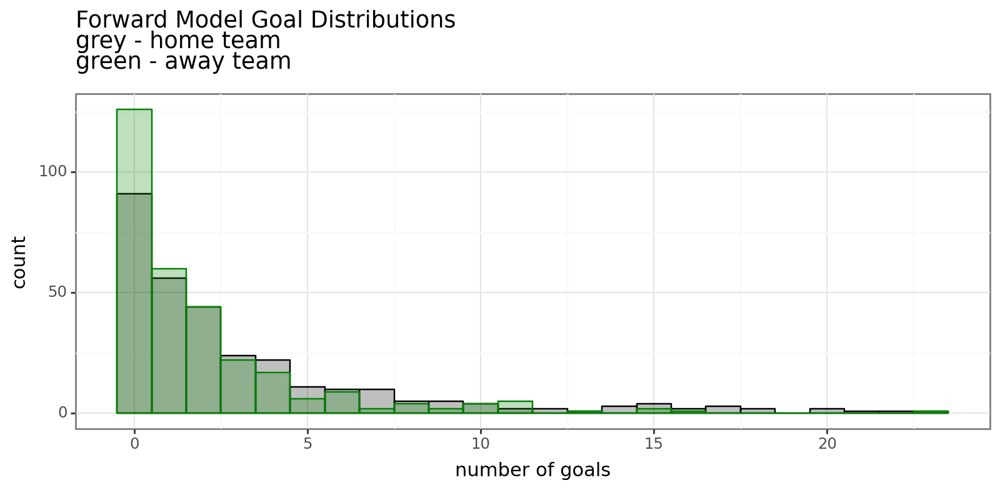

In [24]:
p = (ggplot(season_sim, aes('home_team_goals')) +
     geom_histogram(fill='black', color='black', binwidth=1, alpha=0.25) +
     geom_histogram(aes('away_team_goals'), fill='green', color='green', binwidth=1, alpha=0.25)+
     labs(x='number of goals',
          y='count',
          title=f'Forward Model Goal Distributions\ngrey - home team\ngreen - away team') +
     theme(figure_size=(8,4))
    )
plt.close()
p.draw()

# Model 1.2 - Non Hierarchical Model
+ Priors adjusted based on simulation
+ Unpooled, non-hierarchical model
+ variable names changed for better intuition

In [25]:
with pm.Model() as model1_2:
    # home advantage
    home = pm.Normal("home", mu=0.5, sigma=0.5/3)

    # priors
    att_t = pm.Normal('att_t', mu=1.5, sigma=0.66, shape=n_teams)
    def_t = pm.Normal('def_t', mu=-1.5, sigma=0.66, shape=n_teams)

    # Apply zero sum constraint
    att_t_adj = pm.Deterministic("att_t_adj", att_t - pt.mean(att_t))
    def_t_adj = pm.Deterministic('def_t_adj', def_t - pt.mean(def_t))

    # log linear random effect model
    theta_home = pm.Deterministic('theta_home', pt.exp(home + att_t_adj[home_idx] + def_t_adj[away_idx]))
    theta_away = pm.Deterministic('theta_away', pt.exp(att_t_adj[away_idx] + def_t_adj[home_idx]))
    
    # likelihood
    home_goalsl = pm.Poisson('home_goalsl', mu=theta_home, observed=home_goals)
    away_goalsl = pm.Poisson('away_goalsl', mu=theta_away, observed=away_goals)

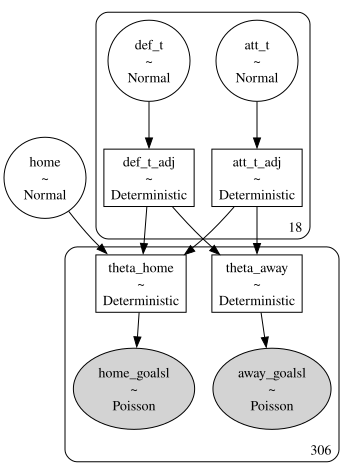

In [26]:
pm.model_to_graphviz(model1_2)

## Model 1.2 Prior Predictive Checks

In [27]:
with model1_2:
    idata1_2 = pm.sample_prior_predictive()

Sampling: [att_t, away_goalsl, def_t, home, home_goalsl]


In [28]:
idata1_2

Inference data with groups:
	> prior
	> prior_predictive
	> observed_data

In [29]:
summ_prior1_2 = az.summary(idata1_2.prior_predictive)
summ_prior1_2['locn'] = summ_prior1_2.index.str.split('_').str[0]
summ_prior1_2['game_num'] = summ_prior1_2.index.str.split('[').str[1].str.replace(']', '').astype(int)
summ_prior1_2['obs_goals'] = np.hstack([df['yg1'].values, df['yg2'].values])
summ_prior1_2

arviz - WARNING - Shape validation failed: input_shape: (1, 500), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,locn,game_num,obs_goals
away_goalsl[0],1.512,2.183,0.0,5.0,0.097,0.073,485.0,461.0,NaN,away,0,0.0
away_goalsl[1],1.492,1.982,0.0,5.0,0.102,0.072,467.0,379.0,NaN,away,1,1.0
away_goalsl[2],1.580,2.090,0.0,5.0,0.088,0.064,586.0,542.0,NaN,away,2,1.0
away_goalsl[3],1.728,2.293,0.0,5.0,0.098,0.069,521.0,482.0,NaN,away,3,1.0
away_goalsl[4],1.532,2.100,0.0,5.0,0.106,0.075,400.0,475.0,NaN,away,4,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
home_goalsl[301],2.500,2.980,0.0,7.0,0.152,0.108,542.0,433.0,NaN,home,301,1.0
home_goalsl[302],2.514,3.211,0.0,8.0,0.160,0.123,505.0,366.0,NaN,home,302,0.0
home_goalsl[303],2.394,3.114,0.0,8.0,0.133,0.109,617.0,493.0,NaN,home,303,0.0
home_goalsl[304],2.676,4.365,0.0,7.0,0.205,0.145,345.0,371.0,NaN,home,304,8.0


In [30]:
np.arange(13)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

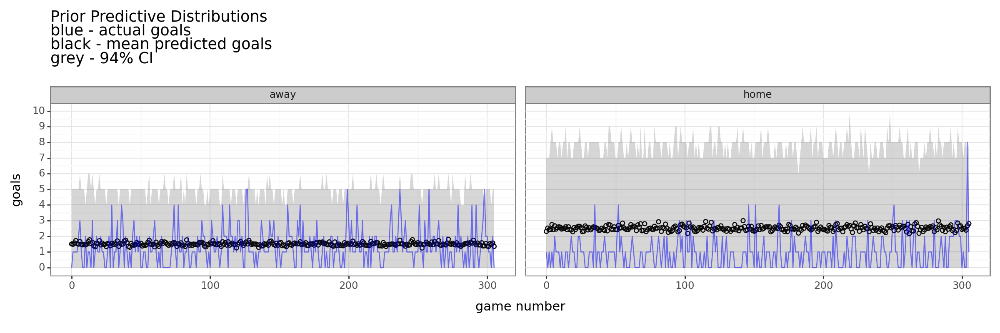

In [31]:
p = (ggplot(summ_prior1_2, aes(x='game_num', group='locn')) +
     geom_point(aes(y='mean'), fill='none') +
     geom_ribbon(aes(ymin='hdi_3%', ymax='hdi_97%'), alpha=0.2) +
     geom_line(aes(y='obs_goals'), color='blue', alpha=0.25) +
     scale_y_continuous(breaks=np.arange(14)) +
     # # geom_errorbarh(aes(xmin='2.5%_CI', xmax='97.5%_CI'), height=0.025, alpha=0.3) +
     # geom_abline(intercept=0, slope=1, alpha=0.5, linetype='dashed') +
     # coord_cartesian(xlim=(0, 1.0), ylim=(0, 1.0)) +
     # scale_x_continuous() +
     labs(x='game number',
          y='goals',
          title=f'Prior Predictive Distributions\nblue - actual goals\nblack - mean predicted goals\ngrey - 94% CI') +
     facet_wrap('locn') +
     theme(figure_size=(12,4))
    )
plt.close()
p.draw()

In [32]:
# p = (ggplot(season_sim, aes('home_team_goals')) +
#      geom_histogram(fill='black', color='black', binwidth=1, alpha=0.25) +
#      geom_histogram(aes('away_team_goals'), fill='green', color='green', binwidth=1, alpha=0.25)+
#      labs(x='number of goals',
#           y='count',
#           title=f'Forward Model Goal Distributions\ngrey - home team\ngreen - away team') +
#      theme(figure_size=(8,4))
#     )
# plt.close()
# p.draw()

In [33]:
with model1_2:
    idata1_2.extend(pm.sample())
    # idata1_2.extend(pm.sample(tune=2000, target_accept=0.95))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [home, att_t, def_t]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


In [34]:
idata1_2

Inference data with groups:
	> posterior
	> sample_stats
	> prior
	> prior_predictive
	> observed_data

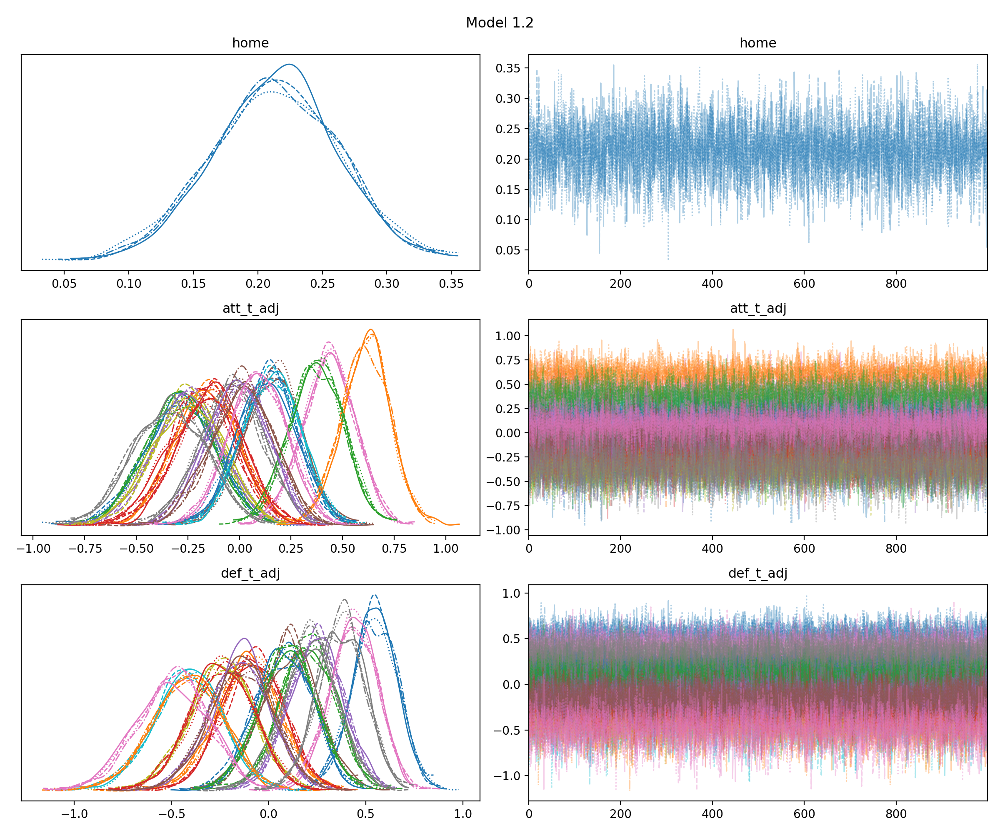

In [35]:
az.plot_trace(idata1_2, var_names=['^home$', 't_adj'], filter_vars='regex', figsize=(12, 10))
plt.suptitle('Model 1.2')
plt.tight_layout()
plt.show();

In [36]:
summ1_2 = az.summary(idata1_2)
summ1_2

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
home,0.213,0.048,0.121,0.303,0.001,0.000,5158.0,3104.0,1.0
att_t[0],1.210,0.229,0.785,1.644,0.007,0.005,932.0,1484.0,1.0
att_t[1],1.340,0.220,0.938,1.769,0.007,0.005,917.0,1368.0,1.0
att_t[2],1.215,0.223,0.793,1.613,0.007,0.005,931.0,1328.0,1.0
att_t[3],1.315,0.227,0.882,1.741,0.008,0.006,875.0,1165.0,1.0
...,...,...,...,...,...,...,...,...,...
theta_away[301],0.940,0.206,0.573,1.320,0.002,0.002,9393.0,2741.0,1.0
theta_away[302],1.085,0.229,0.664,1.508,0.002,0.002,9462.0,2998.0,1.0
theta_away[303],0.685,0.159,0.413,0.991,0.002,0.001,10747.0,2990.0,1.0
theta_away[304],2.897,0.484,2.009,3.769,0.005,0.004,8416.0,2812.0,1.0


In [37]:
att_effect = summ1_2.filter(regex='att_t_adj', axis=0)['mean'].rename('mean_attack_effect').reset_index(drop=True)
def_effect = summ1_2.filter(regex='def_t_adj', axis=0)['mean'].rename('mean_defence_effect').reset_index(drop=True)
non_hier_effects = pd.concat([att_effect, def_effect], axis=1)
non_hier_effects.index = list(team_dict.keys())
non_hier_effects['model'] = 'non-hier'
non_hier_effects

,mean_attack_effect,mean_defence_effect,model
Ascoli,-0.292,0.546,non-hier
Atalanta,-0.161,-0.106,non-hier
Bari,-0.287,0.202,non-hier
Cagliari,-0.187,-0.081,non-hier
Cremonese,-0.253,0.243,non-hier
Fiorentina,0.157,0.105,non-hier
Foggia,0.433,0.438,non-hier
Genoa,-0.039,0.214,non-hier
Inter,-0.251,-0.243,non-hier
Juventus,0.152,-0.416,non-hier


In [38]:
# p = (ggplot(non_hier_effects, aes(x='mean_attack_effect', y='mean_defence_effect')) +
#      geom_point(fill='none', color='black') +
#      geom_text(aes(label=non_hier_effects.index), color='black', size=8, nudge_y=0.05, va='bottom') +
#      geom_hline(yintercept=0.0, alpha=0.5) +
#      geom_vline(xintercept=0.0, alpha=0.5) +
#      labs(title='Model 1.2 - Non-hierarchical\nScatterplot of posterior Team Strengths',
#           x='mean attack', y='mean defence')
#      )
# p.draw()

## TODO - model 1.2
+ Plot of attack strength vs defence strength for named teams
+ insert team names
+ 
---

# Why Hierarchical ?
TODO

# Model 1.3 Back to Hierarchical with modified prior distributions
+ Hierarchical Model
+ Priors narrowed based on learning from non-hierarchical model
+ Prior distributions changed to more common distributions

In [39]:
with pm.Model() as model1_3:
    # home advantage
    home = pm.Normal("home", mu=0.5, sigma=0.5/3)

    # hyper-priors
    mu_att = pm.Normal('mu_att', mu=2.0, sigma=1.0)
    sigma_att = pm.HalfNormal('sigma_att', sigma=1.0)    
    mu_def = pm.Normal('mu_def', mu=-2.0, sigma=1.0)
    sigma_def = pm.HalfNormal('sigma_def', sigma=1.0)

    # priors
    att_t = pm.Normal('att_t', mu=mu_att, sigma=sigma_att, shape=n_teams)
    def_t = pm.Normal('def_t', mu=mu_def, sigma=sigma_def, shape=n_teams)

    # Apply zero sum constraint
    att_t_adj = pm.Deterministic("att_t_adj", att_t - pt.mean(att_t))
    def_t_adj = pm.Deterministic('def_t_adj', def_t - pt.mean(def_t))

    # log linear random effect model
    theta_home = pm.Deterministic('theta_home', pt.exp(home + att_t_adj[home_idx] + def_t_adj[away_idx]))
    theta_away = pm.Deterministic('theta_away', pt.exp(att_t_adj[away_idx] + def_t_adj[home_idx]))
    
    # likelihood
    home_lambda = pm.Poisson('home_lambda', mu=theta_home, observed=home_goals)
    away_lambda = pm.Poisson('away_lambda', mu=theta_away, observed=away_goals)

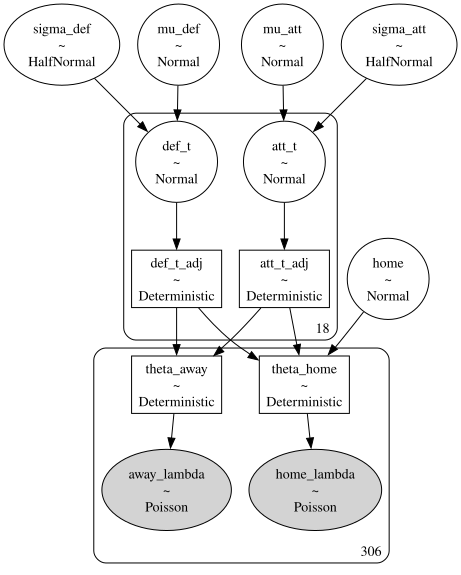

In [40]:
pm.model_to_graphviz(model1_3)

In [41]:
with model1_3:
    idata1_3 = pm.sample_prior_predictive()

Sampling: [att_t, away_lambda, def_t, home, home_lambda, mu_att, mu_def, sigma_att, sigma_def]


In [42]:
with model1_3:
    idata1_3.extend(pm.sample())
#     # idata1_2.extend(pm.sample(tune=2000, target_accept=0.95))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [home, mu_att, sigma_att, mu_def, sigma_def, att_t, def_t]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 18 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
There were 22 divergences after tuning. Increase `target_accept` or reparameterize.


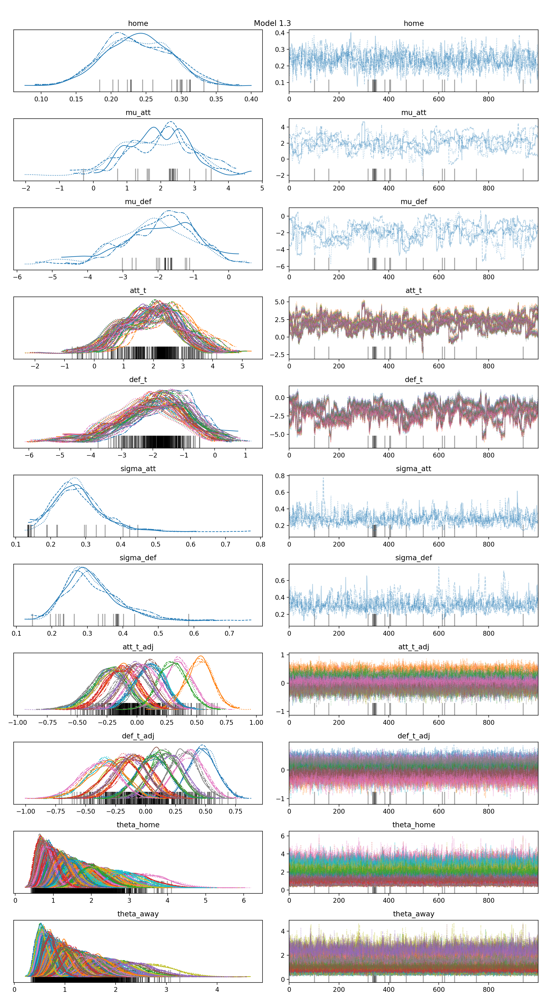

In [43]:
# az.plot_trace(idata1_3, var_names=['^home$', 't_adj'], filter_vars='regex', figsize=(12, 10))
az.plot_trace(idata1_3)
plt.suptitle('Model 1.3')
plt.tight_layout()
plt.show();

# Hierarchical Model Troubleshooting

# Model 1.4 - Non-centred Hierarchical Model
+ Non-centred parametrization

In [44]:
with pm.Model() as model1_4:
    # home advantage
    home = pm.Normal("home", mu=0.5, sigma=0.5/3)

    # hyper-priors
    mu_att_ = pm.Normal('mu_att', mu=2.0, sigma=1.0)
    sigma_att = pm.HalfNormal('sigma_att', sigma=1.0)    
    mu_def_ = pm.Normal('mu_def', mu=-2.0, sigma=1.0)
    sigma_def = pm.HalfNormal('sigma_def', sigma=1.0)

    # offsets ?
    att_t_ = pm.Normal("att_t_", 0, 1, shape=n_teams)
    def_t_ = pm.Normal('def_t_', 0, 1, shape=n_teams)

    # priors    
    att_t = pm.Deterministic('att_t', mu_att_ + att_t_ * sigma_att)
    def_t = pm.Deterministic('def_t', mu_def_ + def_t_ * sigma_def)

    
    # Apply zero sum constraint
    att_t_adj = pm.Deterministic("att_t_adj", att_t - pt.mean(att_t))
    def_t_adj = pm.Deterministic('def_t_adj', def_t - pt.mean(def_t))

    # log linear random effect model
    theta_home = pm.Deterministic('theta_home', pt.exp(home + att_t_adj[home_idx] + def_t_adj[away_idx]))
    theta_away = pm.Deterministic('theta_away', pt.exp(att_t_adj[away_idx] + def_t_adj[home_idx]))
    
    # likelihood
    home_lambda = pm.Poisson('home_lambda', mu=theta_home, observed=home_goals)
    away_lambda = pm.Poisson('away_lambda', mu=theta_away, observed=away_goals)

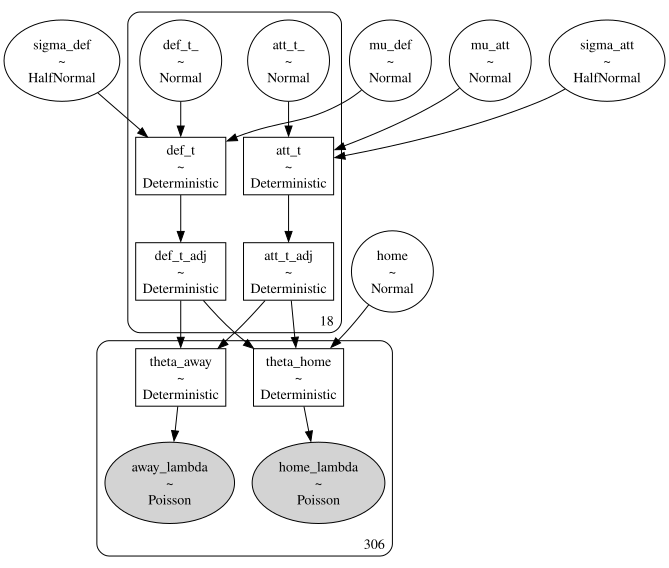

In [45]:
pm.model_to_graphviz(model1_4)

In [46]:
with model1_4:
    idata1_4 = pm.sample_prior_predictive()

Sampling: [att_t_, away_lambda, def_t_, home, home_lambda, mu_att, mu_def, sigma_att, sigma_def]


In [47]:
idata1_4

Inference data with groups:
	> prior
	> prior_predictive
	> observed_data

In [48]:
with model1_4:
    # idata1_4.extend(pm.sample(4000, tune=2000))
    idata1_4.extend(pm.sample())

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [home, mu_att, sigma_att, mu_def, sigma_def, att_t_, def_t_]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 7 seconds.


In [49]:
with model1_4:
    pm.sample_posterior_predictive(trace=idata1_4, extend_inferencedata=True)

Sampling: [away_lambda, home_lambda]


In [50]:
idata1_4

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> prior
	> prior_predictive
	> observed_data

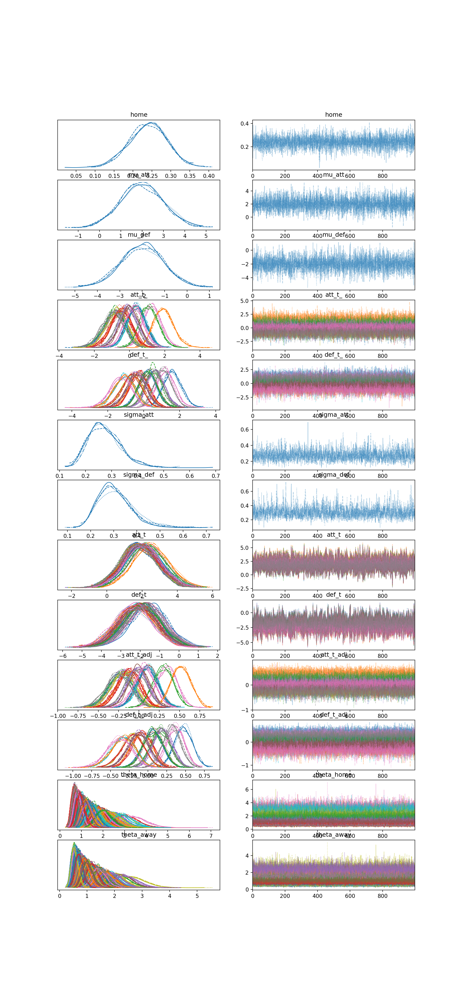

In [51]:
az.plot_trace(idata1_4);

# Comparison of model 1.4 Results to Original Paper

In [52]:
summ_1_4 = az.summary(idata1_4, hdi_prob=0.95).round(2)
summ_1_4

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
home,0.24,0.05,0.14,0.33,0.00,0.00,4922.0,2776.0,1.0
mu_att,2.00,0.99,0.14,3.96,0.01,0.01,5781.0,2855.0,1.0
mu_def,-2.00,0.98,-3.96,-0.09,0.02,0.01,4161.0,2848.0,1.0
att_t_[0],-0.86,0.62,-2.04,0.33,0.01,0.01,4268.0,2618.0,1.0
att_t_[1],-0.48,0.59,-1.68,0.60,0.01,0.01,3657.0,2544.0,1.0
...,...,...,...,...,...,...,...,...,...
theta_away[301],0.93,0.18,0.61,1.30,0.00,0.00,5319.0,3016.0,1.0
theta_away[302],1.05,0.20,0.70,1.47,0.00,0.00,4713.0,2947.0,1.0
theta_away[303],0.74,0.15,0.45,1.03,0.00,0.00,5764.0,2754.0,1.0
theta_away[304],2.45,0.42,1.70,3.30,0.01,0.00,5387.0,3717.0,1.0


In [53]:
att_rows = summ_1_4.filter(regex='att_t_adj', axis=0).index.tolist()
atts = summ_1_4.loc[att_rows + ['home'], ['mean', 'hdi_2.5%', 'hdi_97.5%']]
atts.index = list(team_dict.keys()) + ['home']
atts

,mean,hdi_2.5%,hdi_97.5%
Ascoli,-0.23,-0.54,0.06
Atalanta,-0.13,-0.40,0.14
Bari,-0.22,-0.51,0.05
Cagliari,-0.15,-0.42,0.13
Cremonese,-0.20,-0.48,0.08
Fiorentina,0.11,-0.14,0.36
Foggia,0.34,0.10,0.58
Genoa,-0.04,-0.29,0.24
Inter,-0.19,-0.47,0.08
Juventus,0.12,-0.14,0.36


In [54]:
idata1_4

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> prior
	> prior_predictive
	> observed_data

In [55]:
home_goals_df = idata1_4.posterior_predictive['home_lambda'].to_dataframe()
away_goals_df = idata1_4.posterior_predictive['away_lambda'].to_dataframe()
scores_df = pd.concat([home_goals_df, away_goals_df], axis=1).droplevel((0,1), axis=0).reset_index().rename(columns={'index': 'game_num'})
scores_df

,game_num,home_lambda,away_lambda
0,0,0,0
1,1,0,1
2,2,1,1
3,3,2,2
4,4,0,2
...,...,...,...
1223995,301,2,0
1223996,302,0,1
1223997,303,0,0
1223998,304,1,0


In [56]:
game_probs = []
for game_num, game_df in scores_df.groupby(by=['game_num']):
    p_hwin = (game_df['home_lambda'] > game_df['away_lambda']).sum() / len(game_df)
    p_draw = (game_df['home_lambda'] == game_df['away_lambda']).sum() / len(game_df)
    p_awin = (game_df['home_lambda'] < game_df['away_lambda']).sum() / len(game_df)
    game_probs.append(pd.DataFrame({'p(hwin)pred': [p_hwin], 'p(draw)pred': [p_draw], 'p(awin)pred': [p_awin]}, index=game_num))
probs_df = pd.concat(game_probs, axis=0)
df_res = pd.concat([df, probs_df, pd.get_dummies(df['result']).astype(int)], axis=1)
df_res    

,g,home,away,hg,ag,yg1,yg2,result,p(hwin)pred,p(draw)pred,p(awin)pred,awin,draw,hwin
0,0,Verona,Roma,17,14,0.0,1.0,awin,0.24650,0.26925,0.48425,1,0,0
1,1,Napoli,Atalanta,12,1,1.0,0.0,hwin,0.52000,0.24275,0.23725,0,0,1
2,2,Lazio,Parma,10,13,1.0,1.0,draw,0.39550,0.29400,0.31050,0,1,0
3,3,Juventus,Fiorentina,9,5,1.0,0.0,hwin,0.54025,0.26275,0.19700,0,0,1
4,4,Inter,Foggia,8,6,1.0,1.0,draw,0.45325,0.24750,0.29925,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,301,Parma,Fiorentina,13,5,1.0,1.0,draw,0.43050,0.28250,0.28700,0,1,0
302,302,Napoli,Genoa,12,7,1.0,0.0,hwin,0.60300,0.21425,0.18275,0,0,1
303,303,Inter,Atalanta,8,1,0.0,0.0,draw,0.40675,0.33125,0.26200,0,1,0
304,304,Foggia,Milan,6,11,2.0,8.0,awin,0.19925,0.16925,0.63150,1,0,0


In [57]:
# df_res = pd.concat([probs_df, pd.get_dummies(df_res['result'])], axis=1)
# df_res

In [58]:
# stop

In [59]:
# theta_home_mean_ser = summ_df.filter(regex='theta_home', axis=0)['mean'].rename('theta_home_mean').reset_index(drop=True)
# theta_away_mean_ser = summ_df.filter(regex='theta_away', axis=0)['mean'].rename('theta_away_mean').reset_index(drop=True)
# df_res = pd.concat([df, theta_home_mean_ser, theta_away_mean_ser], axis=1)
# df_res

In [60]:
# # TODO - Remove and use distributions from model
# # https://pena.lt/y/2021/08/25/predicting-football-results-using-bayesian-statistics-with-python-and-pymc3/
# def win_draw_loss(home_expectation, away_expectation, max_goals=10):
#     h = poisson.pmf(range(max_goals+1), home_expectation)
#     a = poisson.pmf(range(max_goals+1), away_expectation)    
#     m = np.outer(h, a)

#     home = np.sum(np.tril(m, -1))
#     away = np.sum(np.triu(m, 1))
#     draw = np.sum(np.diag(m))

#     return home, draw, away

In [61]:
# df_res[['p(hwinc)', 'p(drawc)', 'p(awinc)']] = df_res.apply(lambda x: win_draw_loss(x.theta_home_mean, x.theta_away_mean),
#                                                          axis=1, result_type='expand')
# df_res = pd.concat([df_res, pd.get_dummies(df_res['result'])], axis=1)
# df_res

In [81]:
dfc = df_res.copy()
n_bins = 10
strategy='quantile'
pred_cols=['p(hwin)pred', 'p(draw)pred', 'p(awin)pred']
n_matches = len(dfc)
cal_df = make_1x2_calib_data(dfc, n_bins=n_bins, strategy=strategy, pred_cols=pred_cols)
cal_df.head()

,bin_num,mean_predicted_proba,mean_actual_proba,bin_count,prob_pred,bin_count,25.0%_CI,75.0%_CI,calib
0,0,0.194016,0.000000,31,0.194016,31,0.146112,0.241921,hwin
1,1,0.270266,0.258065,31,0.270266,31,0.216467,0.324065,hwin
2,2,0.320726,0.354839,31,0.320726,31,0.264182,0.377269,hwin
3,3,0.367883,0.300000,30,0.367883,30,0.308499,0.427267,hwin
4,4,0.403967,0.300000,30,0.403967,30,0.343541,0.464393,hwin


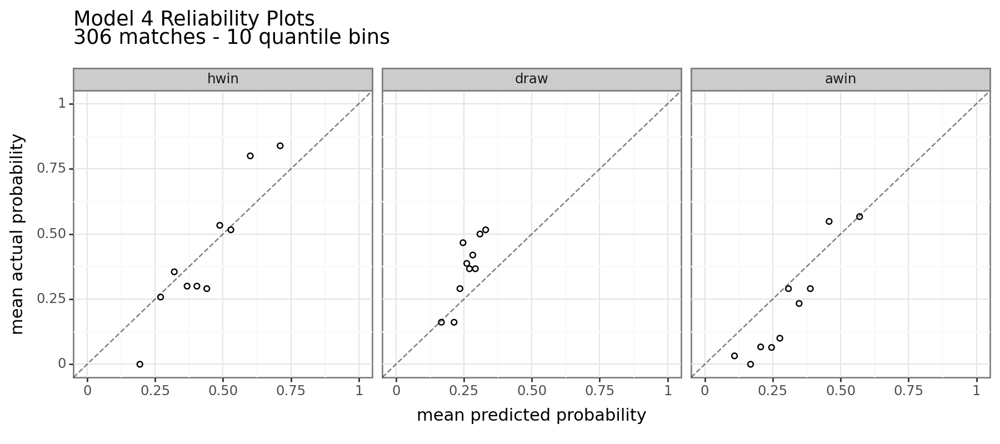

In [82]:
p = (ggplot(cal_df, aes(x='mean_predicted_proba', y='mean_actual_proba', group='calib')) +
     geom_point(fill='none') +
     # geom_errorbarh(aes(xmin='2.5%_CI', xmax='97.5%_CI'), height=0.025, alpha=0.3) +
     geom_abline(intercept=0, slope=1, alpha=0.5, linetype='dashed') +
     coord_cartesian(xlim=(0, 1.0), ylim=(0, 1.0)) +
     labs(x='mean predicted probability',
          y='mean actual probability',
          title=f'Model 4 Reliability Plots\n{n_matches} matches - {n_bins} {strategy} bins') +
     facet_wrap('calib') +
     theme(figure_size=(9,4))
    )
plt.close()
p.draw()

# Shrinkage

In [64]:
att_effect = summ_1_4.filter(regex='att_t_adj', axis=0)['mean'].rename('mean_attack_effect').reset_index(drop=True)
def_effect = summ_1_4.filter(regex='def_t_adj', axis=0)['mean'].rename('mean_defence_effect').reset_index(drop=True)
hier_effects = pd.concat([att_effect, def_effect], axis=1)
hier_effects.index = list(team_dict.keys())
hier_effects['model'] = 'hier'
hier_effects

,mean_attack_effect,mean_defence_effect,model
Ascoli,-0.23,0.47,hier
Atalanta,-0.13,-0.09,hier
Bari,-0.22,0.16,hier
Cagliari,-0.15,-0.07,hier
Cremonese,-0.20,0.20,hier
Fiorentina,0.11,0.07,hier
Foggia,0.34,0.36,hier
Genoa,-0.04,0.17,hier
Inter,-0.19,-0.20,hier
Juventus,0.12,-0.33,hier


In [65]:
full_effects = pd.concat([non_hier_effects, hier_effects], axis=0)
full_effects

,mean_attack_effect,mean_defence_effect,model
Ascoli,-0.292,0.546,non-hier
Atalanta,-0.161,-0.106,non-hier
Bari,-0.287,0.202,non-hier
Cagliari,-0.187,-0.081,non-hier
Cremonese,-0.253,0.243,non-hier
Fiorentina,0.157,0.105,non-hier
Foggia,0.433,0.438,non-hier
Genoa,-0.039,0.214,non-hier
Inter,-0.251,-0.243,non-hier
Juventus,0.152,-0.416,non-hier


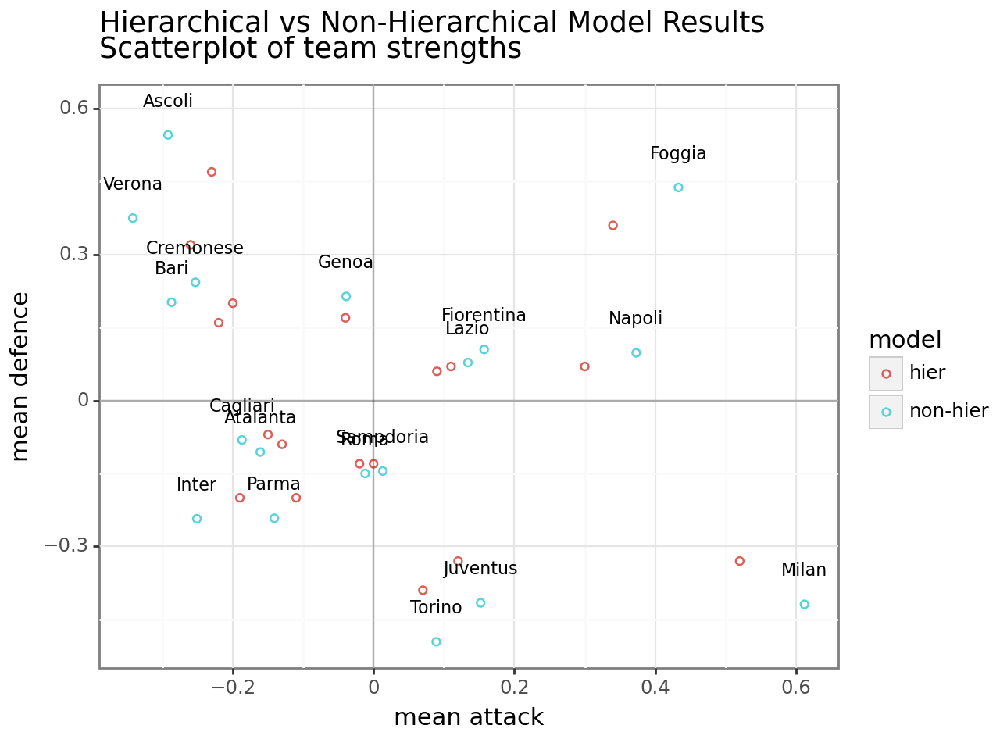

In [66]:
p = (ggplot(full_effects, aes(x='mean_attack_effect', y='mean_defence_effect', color='model')) +
     geom_point(fill='none') +
     geom_text(non_hier_effects, aes(label=non_hier_effects.index), color='black', size=8, nudge_y=0.05, va='bottom') +
     geom_hline(yintercept=0.0, alpha=0.25) +
     geom_vline(xintercept=0.0, alpha=0.25) +
     labs(title='Hierarchical vs Non-Hierarchical Model Results\nScatterplot of team strengths',
          x='mean attack', y='mean defence')
     )
p.draw()

# Summary

In [67]:
# stop

In [68]:
# TODO COORDS

In [69]:
# with pm.Model() as model4:
#     # home advantage
#     home = pm.Normal("home", mu=0.0, sigma=1.0)

#     # hyper-priors
#     mu_att_ = pm.Normal('mu_att', mu=0, sigma=1.0)
#     sigma_att = pm.HalfNormal('sigma_att', sigma=1.0)    
#     mu_def_ = pm.Normal('mu_def', mu=0, sigma=1.0)
#     sigma_def = pm.HalfNormal('sigma_def', sigma=1.0)

#     att_t_ = pm.Normal("att_t_", 0, 1, shape=n_teams)
#     def_t_ = pm.Normal('def_t_', 0,1, shape=n_teams)

#     # priors    
#     att_t = pm.Deterministic('att_t', mu_att_ + att_t_ * sigma_att)
#     def_t = pm.Deterministic('def_t', mu_def_ + def_t_ * sigma_def)
    
#     # Apply zero sum constraint
#     att_t_adj = pm.Deterministic("att_t_adj", att_t - pt.mean(att_t))
#     def_t_adj = pm.Deterministic('def_t_adj', def_t - pt.mean(def_t))

#     # log linear random effect model
#     theta_home = pm.Deterministic('theta_home', pt.exp(home + att_t_adj[home_idx] + def_t_adj[away_idx]))
#     theta_away = pm.Deterministic('theta_away', pt.exp(att_t_adj[away_idx] + def_t_adj[home_idx]))
    
#     # likelihood
#     home_lambda = pm.Poisson('home_lambda', mu=theta_home, observed=home_goals)
#     away_lambda = pm.Poisson('away_lambda', mu=theta_away, observed=away_goals)

In [70]:
# with model4:
#     idata = pm.sample_prior_predictive()

In [71]:
# idata

In [72]:
# with model4:
#     idata = pm.sample()

In [73]:
# az.plot_trace(idata);

In [74]:
# summ_df = az.summary(idata, hdi_prob=0.95).round(2)
# summ_df

In [75]:
# att_rows = summ_df.filter(regex='att_t_adj', axis=0).index.tolist()
# atts = summ_df.loc[['home'] + att_rows, ['mean', 'hdi_2.5%', 'hdi_97.5%']]
# atts

In [76]:
# theta_home_mean_ser = summ_df.filter(regex='theta_home', axis=0)['mean'].rename('theta_home_mean').reset_index(drop=True)
# theta_away_mean_ser = summ_df.filter(regex='theta_away', axis=0)['mean'].rename('theta_away_mean').reset_index(drop=True)
# df_res = pd.concat([df, theta_home_mean_ser, theta_away_mean_ser], axis=1)
# df_res

In [77]:
# # TODO - Remove and use distributions from model
# # https://pena.lt/y/2021/08/25/predicting-football-results-using-bayesian-statistics-with-python-and-pymc3/
# def win_draw_loss(home_expectation, away_expectation, max_goals=10):
#     h = poisson.pmf(range(max_goals+1), home_expectation)
#     a = poisson.pmf(range(max_goals+1), away_expectation)    
#     m = np.outer(h, a)

#     home = np.sum(np.tril(m, -1))
#     away = np.sum(np.triu(m, 1))
#     draw = np.sum(np.diag(m))

#     return home, draw, away

In [78]:
# df_res[['p(hwinc)', 'p(drawc)', 'p(awinc)']] = df_res.apply(lambda x: win_draw_loss(x.theta_home_mean, x.theta_away_mean),
#                                                          axis=1, result_type='expand')
# df_res = pd.concat([df_res, pd.get_dummies(df_res['result'])], axis=1)
# df_res

In [79]:
# dfc = df_res.copy()
# n_bins = 5
# strategy='quantile'
# n_matches = len(dfc)
# cal_df = make_1x2_calib_data(dfc, n_bins=n_bins, strategy=strategy, error_bar_alpha=0.05)
# cal_df.head()

In [80]:
# p = (ggplot(cal_df, aes(x='mean_predicted_proba', y='mean_actual_proba', group='calib')) +
#      geom_point(fill='none') +
#      # geom_errorbarh(aes(xmin='2.5%_CI', xmax='97.5%_CI'), height=0.025, alpha=0.3) +
#      geom_abline(intercept=0, slope=1, alpha=0.5, linetype='dashed') +
#      coord_cartesian(xlim=(0, 1.0), ylim=(0, 1.0)) +
#      labs(x='mean predicted probability',
#           y='mean actual probability',
#           title=f'Model 4 Reliability Plots\n{n_matches} matches - {n_bins} {strategy} bins') +
#      facet_wrap('calib') +
#      theme(figure_size=(9,4))
#     )
# plt.close()
# p.draw()

Changes to make a hierarchical model non-centred

with pm.Model() as hierarchical_model_non_centered:
    # Hyperpriors for group nodes
    mu_a = pm.Normal('mu_a', mu=0., sd=100**2)
    sigma_a = pm.HalfCauchy('sigma_a', 5)
    mu_b = pm.Normal('mu_b', mu=0., sd=100**2)
    sigma_b = pm.HalfCauchy('sigma_b', 5)

    # Before:
    # a = pm.Normal('a', mu=mu_a, sd=sigma_a, shape=n_counties)
    # Transformed:
    a_offset = pm.Normal('a_offset', mu=0, sd=1, shape=n_counties)
    a = pm.Deterministic("a", mu_a + a_offset * sigma_a)

    # Before:
    # b = pm.Normal('b', mu=mu_b, sd=sigma_b, shape=n_counties)
    # Now:
    b_offset = pm.Normal('b_offset', mu=0, sd=1, shape=n_counties)
    b = pm.Deterministic("b", mu_b + b_offset * sigma_b)

    # Model error
    eps = pm.HalfCauchy('eps', 5)
    
    radon_est = a[county_idx] + b[county_idx] * data.floor.values
    
    # Data likelihood
    radon_like = pm.Normal('radon_like', mu=radon_est, sd=eps, observed=data.log_radon)


# Resources
+ [Predicting Football Results With Statistical Modelling (webpage) - David Sheehan](https://dashee87.github.io/football/python/predicting-football-results-with-statistical-modelling/)
+ [Bayesian hierarchical model for the prediction of football results (pdf) - Gianluca Baio1 & Marta A. Blangiardo 2010](https://discovery.ucl.ac.uk/id/eprint/16040/1/16040.pdf)
+ [Analysis of sports data by using bivariate
Poisson models (pdf) - Dimitris Karlis & Ioannis Ntzoufras](http://www2.stat-athens.aueb.gr/~jbn/papers2/08_Karlis_Ntzoufras_2003_RSSD.pdf)
+ [Predicting Football Results Using Bayesian Modelling with Python and PyMC3 (webpage) -  Martin Eastwood - pena.lt/y blog](https://pena.lt/y/2021/08/25/predicting-football-results-using-bayesian-statistics-with-python-and-pymc3/)
+ [Hierarchical Modelling in Stan: Predicting the Premier League (YouTube video & associated material) -  Maggie Lieu - Stan Youtube channel](https://www.youtube.com/watch?v=dNZQrcAjgXQ&list=PLdw9iy95A5dh9tr3ZEiPICRYu8geqi9N9&index=103)
+ [Why hierarchical models are awesome, tricky, and Bayesian (webpage) - Thomas Wiecki - twiecki.io website](https://twiecki.io/blog/2017/02/08/bayesian-hierchical-non-centered/)
+ [Diagnosing Biased Inference with Divergences (webpage) - pymc documentation](https://www.pymc.io/projects/examples/en/latest/diagnostics_and_criticism/Diagnosing_biased_Inference_with_Divergences.html)
+ [Bayesian-Hierarchical-Model-for-the-Prediction-of-Soccer-Results (github repository) - liotti2085 - github](https://github.com/liotti2085/Bayesian-Hierarchical-Model-for-the-Prediction-of-Soccer-Results/tree/main)
+ Data Sources
    + [Italy Serie A 1992-1993](https://fbref.com/en/comps/11/1992-1993/schedule/1992-1993-Serie-A-Scores-and-Fixtures) from fbref.com
    + [Italy Serie A 2007-2008](https://www.football-data.co.uk/italym.php) from football-data.co.uk
    + [Fixture Download website](https://fixturedownload.com/) includes future fixtures

## Original winBUGS code
```
model {
# LIKELIHOOD AND RANDOM EFFECT MODEL FOR THE SCORING PROPENSITY
for (g in 1:ngames) {
# Observed number of goals scored by each team
y1[g] ~ dpois(theta[g,1])
y2[g] ~ dpois(theta[g,2])
# Predictive distribution for the number of goals scored
ynew[g,1] ~ dpois(theta[g,1])
ynew[g,2] ~ dpois(theta[g,2])
# Average Scoring intensities (accounting for mixing components)
log(theta[g,1]) <- home + att[hometeam[g]] + def[awayteam[g]]
log(theta[g,2]) <- att[awayteam[g]] + def[hometeam[g]]
}
# 1. BASIC MODEL FOR THE HYPERPARAMETERS
# prior on the home effect
home ~ dnorm(0,0.0001)
# Trick to code the ‘‘sum-to-zero’’ constraint
for (t in 1:nteams){
att.star[t] ~ dnorm(mu.att,tau.att)
def.star[t] ~ dnorm(mu.def,tau.def)
att[t] <- att.star[t] - mean(att.star[])
def[t] <- def.star[t] - mean(def.star[])
}
# priors on the random effects
mu.att ~ dnorm(0,0.0001)
mu.def ~ dnorm(0,0.0001)
tau.att ~ dgamma(.01,.01)
tau.def ~ dgamma(.01,.01)
# 2. MIXTURE MODEL FOR THE HYPERPARAMETERS
# prior on the home effect
home ~ dnorm(0,0.0001)
# Mixture parameters & components (‘‘sum-to-zero’’ constraint)
for (t in 1:nteams){
grp.att[t] ~ dcat(p.att[t,])
grp.def[t] ~ dcat(p.def[t,])
att[t] ~ dt(mu.att[grp.att[t]],tau.att[grp.att[t]],4)
def[t] ~ dt(mu.def[grp.def[t]],tau.def[grp.def[t]],4)
att.star[t] <- att[t] - mean(att[])
def.star[t] <- def[t] - mean(def[])
# Priors on the mixture parameter (team specific)
p.att[t,1:3] ~ ddirch(prior.att[t,])
p.def[t,1:3] ~ ddirch(prior.def[t,])
}
# Priors on the random effects
# group 1: bottom-table teams
mu.att[1] ~ djl.dnorm.trunc(0,0.001,-3,0)
mu.def[1] ~ djl.dnorm.trunc(0,0.001,0,3)
tau.att[1] ~ dgamma(0.01,0.01)
tau.def[1] ~ dgamma(0.01,0.01)
# group 2: mid-table teams
mu.att[2] <-0
mu.def[2] <-0
tau.att[2] ~ dgamma(0.01,0.01)
tau.def[2] ~ dgamma(0.01,0.01)
# group 3: top-table teams
mu.att[3] ~ djl.dnorm.trunc(0,0.001,0,3)
mu.def[3] ~ djl.dnorm.trunc(0,0.001,-3,0)
tau.att[3] ~ dgamma(0.01,0.01)
tau.def[3] ~ dgamma(0.01,0.01)
}
```